<html>
 <head>
 </head>
 <body>
          <div class="alert alert-block alert-info" style="color:darkgreen;font-size:20px;text-align:center">
         <b>Mapping burnt area, fire forecast, and fire frequency</b>
     </div>
                    <p style="text-align:center;font-size:18px"> <b>Sentinel-2 using Google Earth Engine and Machine Learning (LSTM?) in Python 3.9</b></p>
               <p style="text-align:center"> April 2023 </p>
     <br/>
     <a id='content'></a>
     <p style="color:blue"> <b>Contents:</b> </p>
     <a href="#1."> 1. Mapping fire severity</a><br/>
         &emsp; <a href="#1a"> 1.a burn severity from Sentinel-2</a><br/>
         &emsp; <a href="#1b"> 1.b burn map from MODIS</a><br/>
     <a href="#2." style="color:red"> 2. Fire forecast</a><br/>
     <a href="#3."> 3. Fire history and analysis</a><br/>
     &emsp; <a href="#3a"> 3.a fire statistic</a><br/>
     &emsp; <a href="#3b"> 3.b map of fire frequency</a><br/>
     <br/>
 </body>
</html>

<html>
 <head>
 </head>
 <body>
     <p style="color:#8f00ff"> <b>OVERVIEW</b></p>
          <p> &emsp; &#x2022; Portugal has the largest burnt Area in Europe</p>
     <p> &emsp; &#x2022; From <a href="https://developers.google.com/earth-engine/datasets/catalog/MODIS_061_MCD64A1"  target="_blank">MODIS Burned Area Monthly Global 500m</a>, there are area that burn up to 5 times during 2010-2020</p>
     <br/>
 </body>
</html>

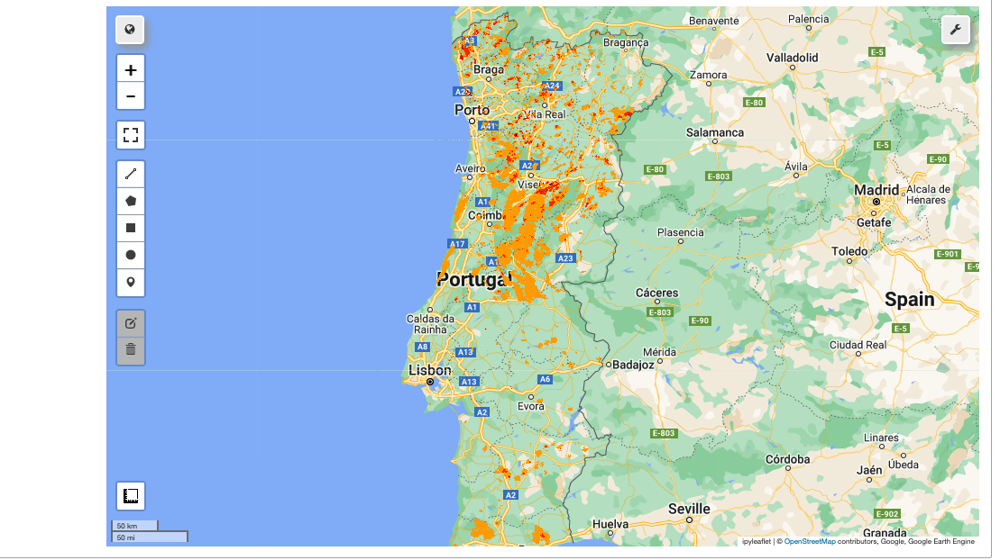

<html>
 <head>
 </head>
 <body>
          <a id='1.'></a>
     <p style="color:blue;font-size:20px"> <b>1. Mapping fire severity</b></p>
     <br/>
      <a id='1a'></a>
     <p style="color:blue;font-size:18px"> 1.a burnt severity from Sentinel-2 </p>
     <br/>
     <p> Reference<a href="https://www.youtube.com/watch?v=_swGA_61kNk"  target="_blank"> RUS Webinar: Burned Area Mapping with Sentinel-2 - HAZA02</a> </p>
     <p> 16:33 Pedrógão Grande, Portugal. Fire occured at 17 June 2017</p>
     <p> &emsp; &#x2022; coordinates: 39.93, -8.14</p>
     <p> &emsp; &#x2022; timeline: 2017-06-04 2017-07-04</p>
     <br/>
 </body>
</html>

In [1]:
import ee
import geemap
import datetime

ee.Initialize()

In [2]:
def waktu_satelit(waktu):
    temp = datetime.datetime.fromtimestamp(waktu/1000).strftime('%Y-%m-%d %H:%M:%S')
    return(temp)

In [52]:
def get_s2_sr_cld_col(aoi, start_date, end_date, s2_col = 'COPERNICUS/S2_SR'):
    s2_sr_col = (ee.ImageCollection(s2_col)
        .filterBounds(aoi).map(clipcol)
        .filterDate(start_date, end_date)
        .filter(ee.Filter.lte('CLOUDY_PIXEL_PERCENTAGE', CLOUD_FILTER)))

    s2_cloudless_col = (ee.ImageCollection('COPERNICUS/S2_CLOUD_PROBABILITY')
        .filterBounds(aoi)
        .filterDate(start_date, end_date))

    return ee.ImageCollection(ee.Join.saveFirst('s2cloudless').apply(**{
        'primary': s2_sr_col,
        'secondary': s2_cloudless_col,
        'condition': ee.Filter.equals(**{
            'leftField': 'system:index',
            'rightField': 'system:index'
        })
    }))


def add_cloud_bands(img):
    cld_prb = ee.Image(img.get('s2cloudless')).select('probability')

    is_cloud = cld_prb.gt(CLD_PRB_THRESH).rename('clouds')

    return img.addBands(ee.Image([cld_prb, is_cloud]))

def add_shadow_bands(img):
    not_water = img.select('SCL').neq(6)

    SR_BAND_SCALE = 1e4
    dark_pixels = img.select('B8').lt(NIR_DRK_THRESH*SR_BAND_SCALE).multiply(not_water).rename('dark_pixels')

    shadow_azimuth = ee.Number(90).subtract(ee.Number(img.get('MEAN_SOLAR_AZIMUTH_ANGLE')));

    cld_proj = (img.select('clouds').directionalDistanceTransform(shadow_azimuth, CLD_PRJ_DIST*10)
        .reproject(**{'crs': img.select(0).projection(), 'scale': 100})
        .select('distance')
        .mask()
        .rename('cloud_transform'))

    shadows = cld_proj.multiply(dark_pixels).rename('shadows')

    return img.addBands(ee.Image([dark_pixels, cld_proj, shadows]))

def add_cld_shdw_mask(img):
    img_cloud = add_cloud_bands(img)

    img_cloud_shadow = add_shadow_bands(img_cloud)

    is_cld_shdw = img_cloud_shadow.select('clouds').add(img_cloud_shadow.select('shadows')).gt(0)

    is_cld_shdw = (is_cld_shdw.focalMin(2).focalMax(BUFFER*2/20)
        .reproject(**{'crs': img.select([0]).projection(), 'scale': 20})
        .rename('cloudmask'))

    return img_cloud_shadow.addBands(is_cld_shdw)

def apply_cld_shdw_mask(img):
    not_cld_shdw = img.select('cloudmask').Not()

    return img.select('B.*').updateMask(not_cld_shdw)

def resample_SR(img):
    resampled_image = ee.Image(img.reproject(crs='EPSG:4326', scale=SR))
    return resampled_image


def VI_stack(img):
    ndvi = ee.Image(img.select('B8').subtract(img.select('B4')).\
        divide(img.select('B8').add(img.select('B4'))).rename('NDVI'))
    
    ndi45 = ee.Image(img.select('B5').subtract(img.select('B4')).\
        divide(img.select('B5').add(img.select('B4'))).rename('NDI45'))

    savi = ee.Image(img.expression(
        '((1 + L) * (NIR - RED) / (NIR + RED + L))', {
          'NIR': img.select('B8'),
          'RED': img.select('B4'),
            'L':0.428 
        }).rename('SAVI'))


    ndmi = ee.Image(img.select('B8').subtract(img.select('B11')).\
        divide(img.select('B8').add(img.select('B11'))).rename('NDMI'))
    
    ndwi = ee.Image(img.select('B3').subtract(img.select('B8')).\
        divide(img.select('B3').add(img.select('B8'))).rename('NDWI'))
    
    nbr =  ee.Image(img.select('B8').subtract(img.select('B12')).\
        divide(img.select('B8').add(img.select('B12'))).rename('NBR'))
    
    #doy = ee.Number(img.get('system:time_start')).divide(ee.Number(86400000))
    #doyBand = ee.Image.constant(doy).uint16().rename('DOYY')
    #doyBand = doyBand.updateMask(img.select('B8').mask())
    
    return img.addBands(ndvi).addBands(ndi45).addBands(savi).addBands(ndmi).addBands(ndwi).addBands(nbr)

In [3]:
Map=geemap.Map(center=[39.93, -8.14], zoom=9)
Map

Map(center=[39.93, -8.14], controls=(WidgetControl(options=['position', 'transparent_bg'], widget=HBox(childre…

<html>
 <head>
 </head>
 <body>
     <p style="color:brown"> Draw a rectangle in the map canvas</p>
     <p> </p>
 </body>
</html>

In [4]:
Map.draw_features

[]

In [5]:
roi = ee.FeatureCollection(Map.draw_features)

<html>
 <head>
 </head>
 <body>
     <p style="color:brown">Getting the images</p>
     <p> &emsp; &#x2022; one each for prior- and post-fire are enough</p>
     <p> &emsp; &#x2022; By default is <code>COPERNICUS/S2_SR</code>, means Sentinel-2 level 2 that are already corrected atmospheric and radiometric</p>
     <p> &emsp; &#x2022; data that we are interested have tiles T29TNE in 2017-07-04 and 2017-06-04</p>
      <p> &emsp; &#x2022; </p>
     <p> </p>
 </body>
</html>

In [31]:
def clipcol(image):
    clipimage = image.clip(roi)
    return clipimage

CLOUD_FILTER = 30

CLOUD_FILTER = 30 
CLD_PRB_THRESH = 30 
NIR_DRK_THRESH = 0.15
CLD_PRJ_DIST = 1
BUFFER = 50

Start_date = '2017-06-04'
End_date = '2017-07-05'

S2 = get_s2_sr_cld_col(roi, Start_date, End_date)
S2 = (S2.map(add_cld_shdw_mask).map(apply_cld_shdw_mask))

In [32]:
waktu_akusisi = S2.aggregate_array('system:time_start').getInfo()
waktu_akusisi = [waktu_satelit(x) for x in waktu_akusisi]
waktu_akusisi

['2017-06-04 14:27:55',
 '2017-06-04 14:27:55',
 '2017-06-04 14:27:55',
 '2017-06-04 14:27:55',
 '2017-06-07 14:36:17',
 '2017-06-14 14:24:22',
 '2017-06-17 14:33:19',
 '2017-06-24 14:21:12',
 '2017-06-24 14:21:12',
 '2017-07-04 14:24:31',
 '2017-07-04 14:24:31',
 '2017-07-04 14:24:31',
 '2017-07-04 14:24:31']

In [36]:
# pre-fire

S2_pr = S2.toList(4) # get the first 4 images

S2_pr = ee.ImageCollection(S2_pr)
    
S2_pr = ee.Image(S2_pr.mean())

In [42]:
# get the post-fire images: 2017-07-04

S2_ps = S2.toList(4, 9) # get the last 4 images from the list, pass by 9 images beforehand

S2_ps = ee.ImageCollection(S2_ps)
    
S2_ps = ee.Image(S2_ps.mean())

In [45]:
# for good contrast in burnt scar, band combination is R:12, G:11, B:8A 

my_param = {'bands': ['B12',  'B11',  'B8A'], 'max':1500}
Map.addLayer(S2_pr, my_param, 'prior-fire')
Map.addLayer(S2_ps, my_param, 'post-fire')

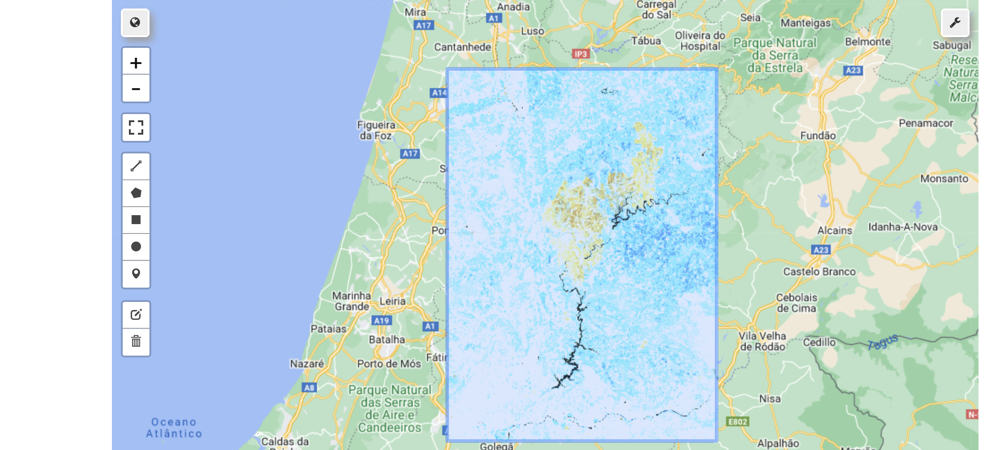

In [46]:
my_param = {'bands': ['B4',  'B3',  'B2'], 'max':1500}

Map.addLayer(S2_ps, my_param, "post-fire RGB")

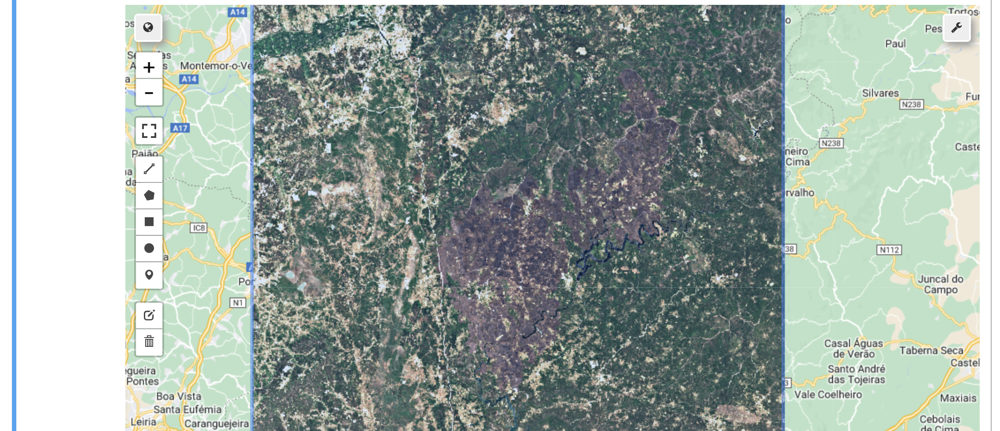

<html>
 <head>
 </head>
 <body>
     <p style="color:#8f00ff"> <b>NOTE</b></p>
     <p> &#x2022; the post-fire image look clean, not much cloud</p>
     <br/>
 </body>
</html>

<html>
 <head>
 </head>
 <body>
     <p style="color:brown">Getting the NBR and dNBR indices</p>
 </body>
</html>

In [53]:
S2_pr = VI_stack(S2_pr)
S2_ps = VI_stack(S2_ps)

In [51]:
my_param = {'bands': 'NBR', 'min':-1, 'max':1}

Map.addLayer(S2_ps, my_param, "post-fire NBR")

In [64]:
non_water =  S2_ps.select('NDWI').lt(0).selfMask().rename('NW')
dNBR = S2_pr.select('NBR').subtract(S2_ps.select('NBR').multiply(non_water)).rename('dNBR')
RBR = dNBR.divide(S2_pr.select('NBR').add(ee.Number(1.001)))

In [65]:
Map.addLayer(dNBR, {}, "dNBR")
Map.addLayer(RBR, {}, "Burn severity")

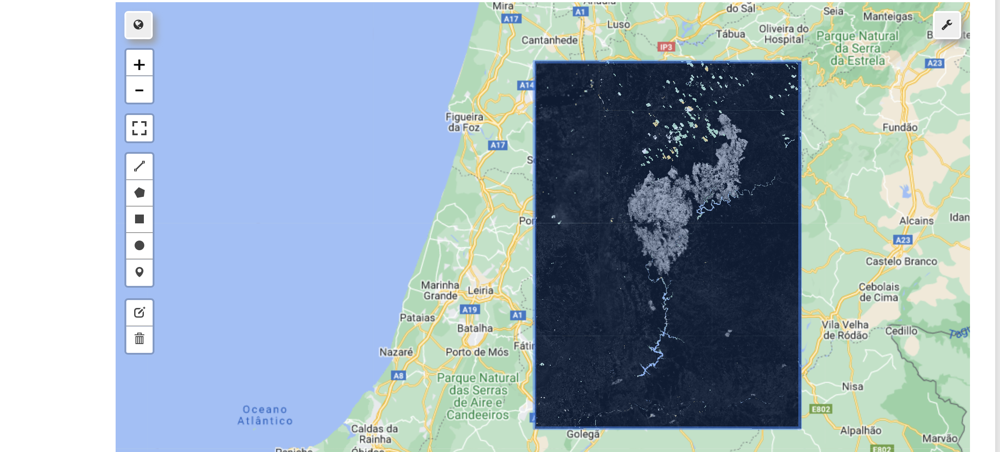

<html>
 <head>
 </head>
 <body>
      <a id='1b'></a>
     <p style="color:blue;font-size:18px"> 1.b burnt map from MODIS</p>
     <br/>
     <p> GEE datasets:</p>
     <p> &emsp; &#x2022; <a href="https://developers.google.com/earth-engine/datasets/catalog/MODIS_061_MCD64A1"  target="_blank">MODIS Burned Area Monthly Global 500m</a>, <code>"MODIS/061/MCD64A1"</code> </p>
     <p> &emsp; &#x2022; <a href="https://developers.google.com/earth-engine/datasets/catalog/FIRMS#description"  target="_blank">FIRMS: Fire Information for Resource Management System</a>, <code>"FIRMS"</code> </p>
     <br/>
 </body>
</html>

In [7]:
def clipcol(image):
    clipimage = image.clip(roi)
    return clipimage

firms = ee.ImageCollection("FIRMS") \
    .filterDate('2017-06-14','2017-06-20') \
    .filterBounds(roi).map(clipcol)

In [11]:
my_param = {'bands': 'T21', 'min':325, 'max':400, 'palette':['red', 'orange', 'yellow']}

Map.addLayer(firms, my_param, "FIRMS")

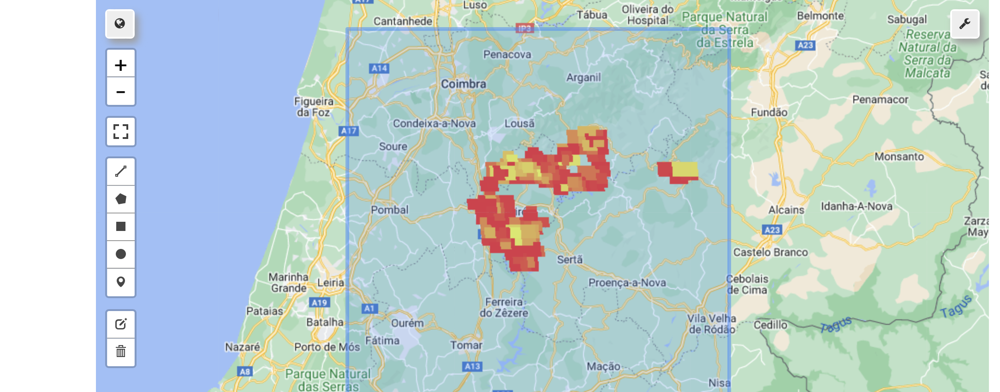

In [14]:
def clipcol(image):
    clipimage = image.clip(roi)
    return clipimage

MBA = ee.ImageCollection('MODIS/061/MCD64A1') \
    .filterDate('2017-06-01','2017-06-30') \
    .filterBounds(roi).map(clipcol)

In [17]:
my_param = {'bands': 'BurnDate', 'min':152, 'max':182, 'palette':['4e0400', '951003', 'c61503', 'ff1901']}

Map.addLayer(MBA.first(), my_param, "Burnt Date")

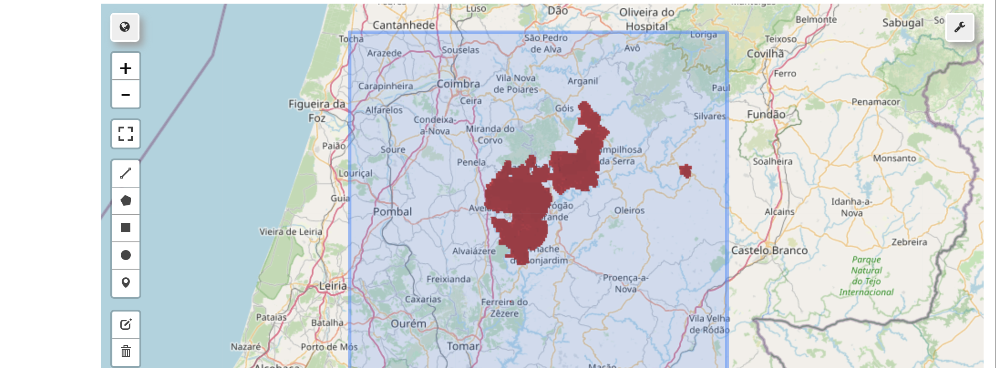

<html>
 <head>
 </head>
 <body>
          <a id='2.'></a>
     <p style="color:blue;font-size:20px"> <b>2. Fire forecast</b></p>
     <br/>
     <p> Reference <a href="https://www.copernicus.eu/en/european-forest-fire-information-system"  target="_blank">EUROPEAN FOREST FIRE INFORMATION SYSTEM</a> </p>
     <p> &emsp; &#x2022; <a href="https://effis.jrc.ec.europa.eu/"  target="_blank">EFFIS homapage</a></p>
     <p> &emsp; &#x2022; map portal: <a href="https://effis.jrc.ec.europa.eu/apps/effis_current_situation/"  target="_blank">EFFIS viewer</a> and <a href="https://gwis.jrc.ec.europa.eu/apps/gwis_current_situation/index.html"  target="_blank">Global Wildfire Information System</a></p>
     <p> &emsp; &#x2022; <a href="https://effis.jrc.ec.europa.eu/apps/effis.longterm.forecasts/"  target="_blank">Long-term Monthly forecast of temperature and rainfall anomalies</a></p>
     <br/>
     <p> Fire forecasting by <a href="https://www.earthdata.nasa.gov/learn/pathfinders/wildfires-data-pathfinder/find-data#fire-forecasting"  target="_blank">NASA</a> </p>
     <br/>
     <p> <a href="https://effis.jrc.ec.europa.eu/applications/data-and-services"  target="_blank">Data and service</a> </p>
      <p> &emsp; &#x2022; for example, FWI (Fire weather index) with 8-km resolution is available as wms service but with png format?</p>
     <p> &emsp; &#x2022; Development of Google Earth Engine Fire Weather Index Calculator for Indonesian Fire Danger Rating System <a href="https://doi.org/10.1088/1755-1315/936/1/012040"  target="_blank">Matondang et al. (2021)</a></p>
     <p> &emsp; &#x2022; check the global burn area mentioned in <a href="https://doi.org/10.1016/j.rse.2019.02.013"  target="_blank">Chuvieco et al. (2019)</a> section 6 table 2</p>
     <p> &emsp; &#x2022; </p>
     <p> &emsp; &#x2022; </p>
     <br/>
 </body>
</html>

In [5]:
import matplotlib.pyplot as plt

In [2]:
# read wms file? 
# https://gis.stackexchange.com/questions/294056/reading-a-wms-raster-map-with-rasterio

import rasterio
from rasterio.plot import show

url ='https://ies-ows.jrc.ec.europa.eu/effis?LAYERS=ecmwf007.fwi&FORMAT=image/png&TRANSPARENT=true&SINGLETILE=false&SERVICE=wms&VERSION=1.1.1&REQUEST=GetMap&STYLES=&SRS=EPSG:4326&BBOX=-18.0,27.0,42.0,72.0&WIDTH=1600&HEIGHT=1200&TIME=2023-04-02'

raster = rasterio.open(url)

print(raster.meta)

{'driver': 'WMS', 'dtype': 'uint8', 'nodata': None, 'width': 1073741824, 'height': 805306368, 'count': 4, 'crs': CRS.from_epsg(4326), 'transform': Affine(5.587935447692871e-08, 0.0, -18.0,
       0.0, -5.587935447692871e-08, 72.0)}


MemoryError: Unable to allocate 2.25 EiB for an array with shape (3, 805306368, 1073741824) and data type uint8

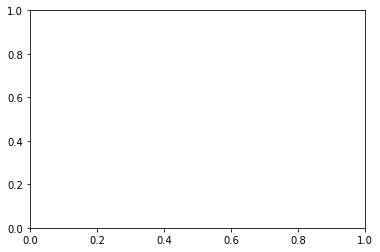

In [8]:
fig, ax = plt.subplots()
rasterio.plot.show(raster, ax=ax)

<html>
 <head>
 </head>
 <body>
     <p style="color:red">WMS file is too big?</p>
      <p> &emsp; &#x2022; </p>
     <p> </p>
 </body>
</html>

In [3]:
raster.shape

(805306368, 1073741824)

In [7]:
type(raster)

rasterio.io.DatasetReader

<html>
 <head>
 </head>
 <body>
          <a id='3.'></a>
     <p style="color:blue;font-size:20px"> <b>3. Fire history and analysis</b></p>
     <br/>
        <a id='3a'></a>
     <p style="color:blue;font-size:18px"> 3.a Fire statistic by country </p>
     <p> Data of fire in Europe are from <a href="https://effis.jrc.ec.europa.eu/apps/effis.statistics/estimates"  target="_blank">EFFIS</a> Estimates for European Non European Union Countries</p>
     <p> &emsp; &#x2022; shapefile of countries is from <a href="https://ec.europa.eu/eurostat/web/gisco/geodata/reference-data/administrative-units-statistical-units/countries"  target="_blank">here</a></p>
     <p> &emsp; &#x2022; Portugal has the highest burnt area</p>
     <br/>
 </body>
</html>

In [4]:
import pandas as pd
import matplotlib.pyplot as plt
import geopandas as gpd

WD = '/Users/ismail/Documents/Machine_learning/Notebook/Github/data/'

In [29]:
EU_fire = pd.read_csv(WD + 'estimates-overview-ba_EU_2023_2006_2022.csv')
NEU_fire = pd.read_csv(WD + 'estimates-overview-ba_Non_EU_2023_2006_2022.csv')
world = gpd.read_file(WD + 'CNTR_RG_01M_2020_3035.shp')


EU_fire = pd.concat([EU_fire, NEU_fire])
EU_fire.head()

,ISO3,Country,Country area (ha),Annual Avg. 2006 - 2022 (ha),Year 2023 (ha),(*) Annual Avg. 2006 - 2022 (%),(*) Year 2023 (%)
0,AUT,Austria,8385823,76.12,398.0,0.00,0.00
1,BEL,Belgium,3070746,224.00,NaN,0.01,NaN
2,BGR,Bulgaria,11158767,10195.06,1605.0,0.09,0.01
3,HRV,Croatia,5707857,14273.12,603.0,0.25,0.01
4,CYP,Cyprus,571965,1716.82,NaN,0.30,NaN


In [47]:
# merging the file
Europe = world.query('EU_STAT == "T" or EFTA_STAT == "T" or CC_STAT == "T" or ISO3_CODE == "BIH" or ISO3_CODE == "GBR"')
EU_fires = Europe[['ISO3_CODE', 'NAME_ENGL', 'geometry']].merge(EU_fire,
                            how= 'left',left_on='ISO3_CODE',right_on='ISO3')

EU_fires.columns

Index(['ISO3_CODE', 'NAME_ENGL', 'geometry', 'ISO3', 'Country',
       'Country area (ha)', 'Annual Avg. 2006 - 2022 (ha)', 'Year 2023 (ha)',
       '(*) Annual Avg. 2006 - 2022 (%)', '(*) Year 2023 (%)'],
      dtype='object')

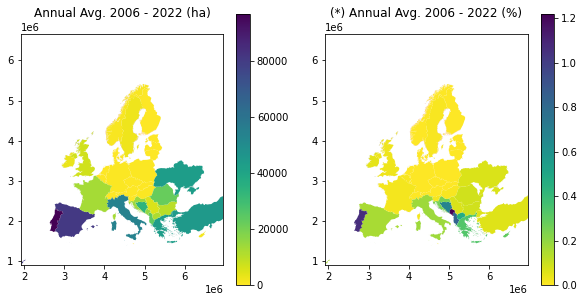

In [53]:
fig, ax = plt.subplots(ncols=2, figsize=(10, 10))

kolom = ['Annual Avg. 2006 - 2022 (ha)', '(*) Annual Avg. 2006 - 2022 (%)']

for i in range(2):
    EU_fires.plot(ax=ax[i], column=kolom[i], cmap='viridis_r', 
              legend = True, legend_kwds={'shrink': 0.5})
    ax[i].set_xlim(1913019, 6963514)
    ax[i].set_ylim(913580, 6653701)
    ax[i].set_title(kolom[i])
plt.show()

<html>
 <head>
 </head>
 <body>
        <a id='3b'></a>
     <p style="color:blue;font-size:18px"> 3.b Fire frequency: example in Portugal </p>
     <p style="color:red"> &emsp; &#x2022; map of damage cost?</p>
     <p> &emsp; &#x2022; </p>
     <br/>
 </body>
</html>

In [54]:
import pandas as pd
import matplotlib.pyplot as plt
import geopandas as gpd

WD = '/Users/ismail/Documents/Machine_learning/Notebook/Github/data/'
world = gpd.read_file(WD + 'CNTR_RG_01M_2020_3035.shp')

<ipython-input-61-d941f5cab445>:4: FutureWarning: Currently, index_parts defaults to True, but in the future, it will default to False to be consistent with Pandas. Use `index_parts=True` to keep the current behavior and True/False to silence the warning.
  PRT = PRT.explode()


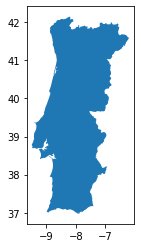

In [61]:
# geometry for Portugal
PRT = world[world['NAME_ENGL']=='Portugal']

PRT = PRT.explode()
PRT['luas'] = PRT.area
PRT = PRT[PRT['luas'] == PRT.area.max()]

PRT = PRT.to_crs('epsg:4326')

PRT.plot()
plt.show()

In [62]:
import ee
import geemap

ee.Initialize()

import datetime

roi = geemap.geopandas_to_ee(PRT)

<html>
 <head>
 </head>
 <body>
     <p style="color:brown">Burned map</p>
      <p> &emsp; &#x2022; 2010-2020</p>
     <p style="color:red"> &emsp; &#x2022; filter the low uncertainty?</p>
     <p> </p>
 </body>
</html>

In [71]:
def clipcol(image):
    clipimage = image.clip(roi)
    return clipimage

MBA = ee.ImageCollection('MODIS/061/MCD64A1') \
    .filterDate('2010-01-01','2020-12-31') \
    .filterBounds(roi).map(clipcol)

In [72]:
# binary fire band (1 burned, 0 no burn)

def BA_cl(img):
    
    BAC = ee.Image(img.select('BurnDate').gte(1).rename('BAC'))
    
    return img.addBands(BAC)

MBA = (MBA.map(BA_cl))

In [68]:
Map=geemap.Map(center=[39.93, -8.14], zoom=7)
Map

Map(center=[39.93, -8.14], controls=(WidgetControl(options=['position', 'transparent_bg'], widget=HBox(childre…

In [78]:
my_param = {'bands': 'BAC', 'min':1, 'max':5, 'palette':['orange', 'red', 'brown', 'black']}

Map.addLayer(MBA.sum(), my_param, "Burnt Date")

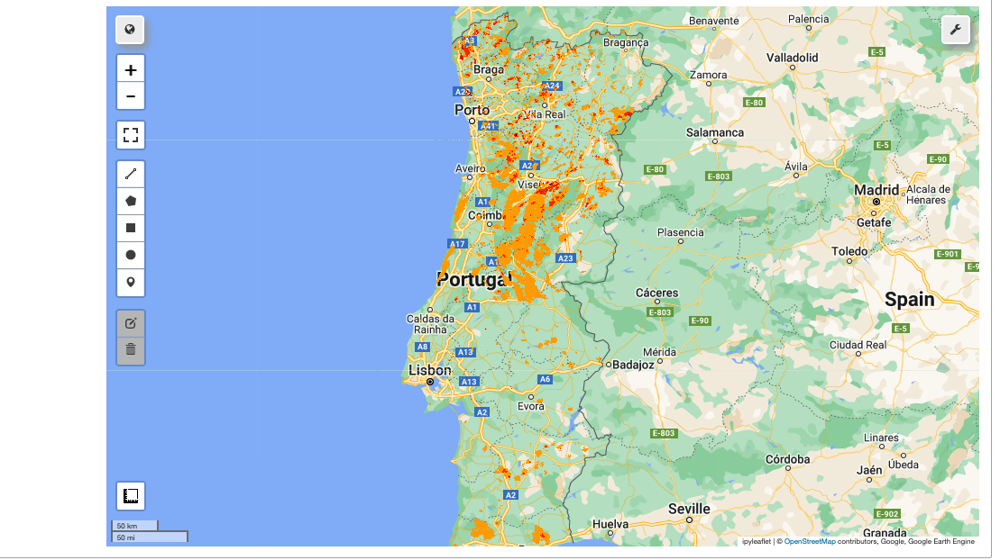

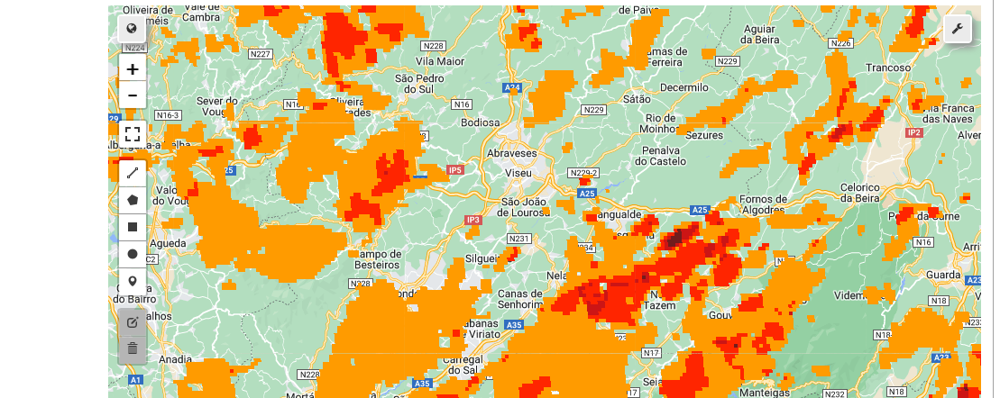